# Otto Group Product Classification Challenge
##### Classify products into the correct category

https://www.kaggle.com/c/otto-group-product-classification-challenge

The Otto Group is one of the world’s biggest e-commerce companies, with subsidiaries in more than 20 countries, including Crate & Barrel (USA), Otto.de (Germany) and 3 Suisses (France). We are selling millions of products worldwide every day, with several thousand products being added to our product line.

A consistent analysis of the performance of our products is crucial. However, due to our diverse global infrastructure, many identical products get classified differently. Therefore, the quality of our product analysis depends heavily on the ability to accurately cluster similar products. The better the classification, the more insights we can generate about our product range.

For this competition, we have provided a dataset with 93 features for more than 200,000 products. The objective is to build a predictive model which is able to distinguish between our main product categories. The winning models will be open sourced.

Submissions are evaluated using the multi-class logarithmic loss.

##### also see autml comparison on datasets https://mljar.com/automl-compare/

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, log_loss

from supervised import AutoML

import os

### Get Dataset

In [2]:
base_folder = "D:\data_dump\kaggle-datasets\otto-classification"
train_data = pd.read_csv(os.path.join(base_folder, 'train.csv'))
test_data = pd.read_csv(os.path.join(base_folder, 'test.csv'))

print(train_data.shape)
print(test_data.shape)

(61878, 95)
(144368, 94)


In [3]:
#find nas or null
print(train_data.isna().values.sum())
print(train_data.isnull().values.sum())
print(test_data.isnull().values.sum())
print(test_data.isnull().values.sum())

0
0
0
0


In [4]:
train_data.describe()

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_84,feat_85,feat_86,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93
count,61878.000000,61878.00000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,...,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000,61878.000000
mean,30939.500000,0.38668,0.263066,0.901467,0.779081,0.071043,0.025696,0.193704,0.662433,1.011296,...,0.070752,0.532306,1.128576,0.393549,0.874915,0.457772,0.812421,0.264941,0.380119,0.126135
std,17862.784315,1.52533,1.252073,2.934818,2.788005,0.438902,0.215333,1.030102,2.255770,3.474822,...,1.151460,1.900438,2.681554,1.575455,2.115466,1.527385,4.597804,2.045646,0.982385,1.201720
min,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15470.250000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,30939.500000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,46408.750000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,61878.000000,61.00000,51.000000,64.000000,70.000000,19.000000,10.000000,38.000000,76.000000,43.000000,...,76.000000,55.000000,65.000000,67.000000,30.000000,61.000000,130.000000,52.000000,19.000000,87.000000


In [5]:
train_data.head()

,id,feat_1,feat_2,feat_3,feat_4,feat_5,feat_6,feat_7,feat_8,feat_9,...,feat_85,feat_86,feat_87,feat_88,feat_89,feat_90,feat_91,feat_92,feat_93,target
0,1,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,Class_1
1,2,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Class_1
2,3,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Class_1
3,4,1,0,0,1,6,1,5,0,0,...,0,1,2,0,0,0,0,0,0,Class_1
4,5,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,Class_1


In [6]:
# get value count for label
train_data.target.value_counts()

target
Class_2    16122
Class_6    14135
Class_8     8464
Class_3     8004
Class_9     4955
Class_7     2839
Class_5     2739
Class_4     2691
Class_1     1929
Name: count, dtype: int64

### Data analysis

I now prefer to use `autoviz` to analyze datasets, create features and see their distributions against classification or regression targets

### Training

In [7]:
def display_metrics(y_true, y_pred):
    print("Accuracy score:", round(accuracy_score(y_true, y_pred),4))
    print("Precision score:", round(precision_score(y_true, y_pred, average='macro'),4))
    print("Recall score:", round(recall_score(y_true, y_pred, average='macro'),4))
    print("F1 score:", round(f1_score(y_true, y_pred, average='macro'),4))
    print("F1 score:", round(f1_score(y_true, y_pred, average='macro'),4))
    print("Confusion Matrix")
    ax =  sns.heatmap(confusion_matrix(y_true, y_pred), annot=True, fmt='')
    ax.set_ylabel('Actual')
    ax.set_xlabel('Predicted');
   

In [8]:
x_cols = train_data.columns[1:-1]

automl = AutoML(mode="Perform", results_path="otto_group_product_mljar_classifier")
automl.fit(train_data[x_cols], train_data["target"])

Linear algorithm was disabled.
AutoML directory: otto_group_product_mljar_classifier
The task is multiclass_classification with evaluation metric logloss
AutoML will use algorithms: ['Random Forest', 'LightGBM', 'Xgboost', 'CatBoost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'not_so_random', 'golden_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'ensemble']
Skip simple_algorithms because no parameters were generated.
* Step default_algorithms will try to check up to 5 models


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


1_Default_LightGBM logloss 0.467744 trained in 149.65 seconds (1-sample predict time 0.178 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


2_Default_Xgboost logloss 0.47177 trained in 319.68 seconds (1-sample predict time 0.192 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


3_Default_CatBoost logloss 0.501235 trained in 307.48 seconds (1-sample predict time 0.109 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


4_Default_NeuralNetwork logloss 0.681725 trained in 123.76 seconds (1-sample predict time 0.34 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


5_Default_RandomForest logloss 1.365371 trained in 134.34 seconds (1-sample predict time 0.3025 seconds)
* Step not_so_random will try to check up to 20 models


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


10_LightGBM logloss 0.472834 trained in 253.33 seconds (1-sample predict time 0.188 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


6_Xgboost logloss 0.46804 trained in 277.65 seconds (1-sample predict time 0.202 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


CatBoostAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


14_CatBoost logloss 0.543225 trained in 321.64 seconds (1-sample predict time 0.132 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


RandomForestAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


18_RandomForest logloss 1.315832 trained in 46.29 seconds (1-sample predict time 0.197 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


MLPAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


22_NeuralNetwork logloss 0.671265 trained in 126.37 seconds (1-sample predict time 0.312 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


11_LightGBM logloss 0.496773 trained in 73.44 seconds (1-sample predict time 0.18 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


7_Xgboost logloss 0.470754 trained in 196.5 seconds (1-sample predict time 0.206 seconds)
* Step golden_features will try to check up to 3 models
None 10
Add Golden Feature: feat_11_diff_feat_14
Add Golden Feature: feat_11_diff_feat_25
Add Golden Feature: feat_11_diff_feat_40
Add Golden Feature: feat_11_diff_feat_34
Add Golden Feature: feat_15_sum_feat_14
Add Golden Feature: feat_11_diff_feat_57
Add Golden Feature: feat_42_sum_feat_11
Add Golden Feature: feat_25_sum_feat_15
Add Golden Feature: feat_3_diff_feat_14
Add Golden Feature: feat_11_diff_feat_88
Created 10 Golden Features in 54.47 seconds.


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


1_Default_LightGBM_GoldenFeatures logloss 0.470871 trained in 210.97 seconds (1-sample predict time 0.268 seconds)
Not enough time to perform features selection. Skip
Time needed for features selection ~ 1071.0 seconds
Please increase total_time_limit to at least (10775 seconds) to have features selection
Skip insert_random_feature because no parameters were generated.
Skip features_selection because no parameters were generated.
* Step hill_climbing_1 will try to check up to 16 models


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


23_LightGBM logloss 0.469799 trained in 156.52 seconds (1-sample predict time 0.199 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


LightgbmAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


24_LightGBM logloss 0.468882 trained in 157.9 seconds (1-sample predict time 0.205 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


25_Xgboost logloss 0.465803 trained in 282.67 seconds (1-sample predict time 0.181 seconds)


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


XgbAlgorithm should either be a classifier to be used with response_method=predict_proba or the response_method should be 'predict'. Got a regressor with response_method=predict_proba instead.
Problem during computing permutation importance. Skipping ...


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


26_Xgboost logloss 0.469706 trained in 193.75 seconds (1-sample predict time 0.184 seconds)
* Step hill_climbing_2 will try to check up to 19 models


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


27_Xgboost not trained. Stop training after the first fold. Time needed to train on the first fold 83.0 seconds. The time estimate for training on all folds is larger than total_time_limit.


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


28_Xgboost not trained. Stop training after the first fold. Time needed to train on the first fold 41.0 seconds. The time estimate for training on all folds is larger than total_time_limit.


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


29_LightGBM not trained. Stop training after the first fold. Time needed to train on the first fold 37.0 seconds. The time estimate for training on all folds is larger than total_time_limit.


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


30_LightGBM not trained. Stop training after the first fold. Time needed to train on the first fold 25.0 seconds. The time estimate for training on all folds is larger than total_time_limit.


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.


31_Xgboost not trained. Stop training after the first fold. Time needed to train on the first fold 83.0 seconds. The time estimate for training on all folds is larger than total_time_limit.
* Step ensemble will try to check up to 1 model


C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_env\Lib\site-packages\sklearn\metrics\_classification.py:2916: UserWarning: The y_pred values do not sum to one. Starting from 1.5 thiswill result in an error.
C:\Users\okmic\.conda\envs\mljar_en

Ensemble logloss 0.459155 trained in 5.22 seconds (1-sample predict time 0.372 seconds)
AutoML fit time: 3690.24 seconds
AutoML best model: Ensemble


AutoML(mode='Perform', results_path='otto_group_product_mljar_classifier')

In [9]:
automl.get_leaderboard().sort_values(by=['metric_value', 'single_prediction_time'])

,name,model_type,metric_type,metric_value,train_time,single_prediction_time
17,Ensemble,Ensemble,logloss,0.459155,5.22,0.3720
15,25_Xgboost,Xgboost,logloss,0.465803,284.56,0.1810
0,1_Default_LightGBM,LightGBM,logloss,0.467744,152.16,0.1780
6,6_Xgboost,Xgboost,logloss,0.468040,279.81,0.2020
14,24_LightGBM,LightGBM,logloss,0.468882,160.47,0.2050
16,26_Xgboost,Xgboost,logloss,0.469706,195.74,0.1840
13,23_LightGBM,LightGBM,logloss,0.469799,159.23,0.1990
11,7_Xgboost,Xgboost,logloss,0.470754,198.70,0.2060
12,1_Default_LightGBM_GoldenFeatures,LightGBM,logloss,0.470871,213.36,0.2680
1,2_Default_Xgboost,Xgboost,logloss,0.471770,321.87,0.1920


Accuracy score: 0.9421
Precision score: 0.958
Recall score: 0.9304
F1 score: 0.9427
F1 score: 0.9427
Confusion Matrix


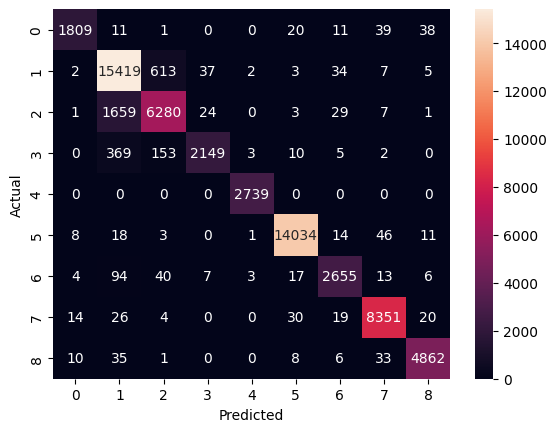

In [10]:
y_train_pred = automl.predict(train_data.drop(columns=['target']))
display_metrics(train_data['target'], y_train_pred)

### Prediction on test set

In [11]:
classes = [f'class_{i+1}' for i in range(automl.n_classes)]
submission = pd.DataFrame(
    data = automl.predict_proba(test_data),
    columns =  classes
)
submission['predicted_target'] = automl.predict(test_data)

In [12]:
submission.head(500)

,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9,predicted_target
0,0.000178,0.125936,0.147918,0.722113,4.879215e-06,0.000136,0.003531,0.000165,0.000018,Class_4
1,0.000386,0.008717,0.001438,0.000343,4.421130e-05,0.558001,0.000781,0.429962,0.000327,Class_6
2,0.000003,0.000009,0.000009,0.000003,5.087656e-08,0.999592,0.000007,0.000371,0.000005,Class_6
3,0.000055,0.617912,0.376409,0.004810,6.198967e-06,0.000050,0.000068,0.000108,0.000582,Class_2
4,0.124672,0.000278,0.000358,0.000067,2.019747e-05,0.002252,0.003116,0.049899,0.819339,Class_9
...,...,...,...,...,...,...,...,...,...,...
495,0.000013,0.844194,0.139681,0.015843,5.889659e-06,0.000100,0.000109,0.000030,0.000026,Class_2
496,0.002023,0.839308,0.123482,0.005169,1.176291e-03,0.008216,0.007271,0.002333,0.011023,Class_2
497,0.000296,0.223402,0.748513,0.019586,3.110079e-04,0.000407,0.005285,0.001894,0.000306,Class_3
498,0.014574,0.256861,0.405754,0.074781,2.750430e-05,0.008940,0.234960,0.001109,0.002994,Class_3


### Report

In [13]:
automl.report()

Best model,name,model_type,metric_type,metric_value,train_time,single_prediction_time
,1_Default_LightGBM,LightGBM,logloss,0.467744,152.16,0.178
,2_Default_Xgboost,Xgboost,logloss,0.47177,321.87,0.192
,3_Default_CatBoost,CatBoost,logloss,0.501235,309.72,0.109
,4_Default_NeuralNetwork,Neural Network,logloss,0.681725,126.85,0.34
,5_Default_RandomForest,Random Forest,logloss,1.36537,136.44,0.3025
,10_LightGBM,LightGBM,logloss,0.472834,255.56,0.188
,6_Xgboost,Xgboost,logloss,0.46804,279.81,0.202
,14_CatBoost,CatBoost,logloss,0.543225,324.14,0.132
,18_RandomForest,Random Forest,logloss,1.31583,48.28,0.197
,22_NeuralNetwork,Neural Network,logloss,0.671265,129.36,0.312
